# Colisão-são-são

In [1]:
#import Collision_Pi as cp
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set_style("darkgrid")
sns.set_palette("icefire", 4)
import warnings
warnings.filterwarnings('ignore')
sns.color_palette("viridis", 4)

[(0.253935, 0.265254, 0.529983),
 (0.163625, 0.471133, 0.558148),
 (0.134692, 0.658636, 0.517649),
 (0.477504, 0.821444, 0.318195)]

In [2]:
class collision():
    def __init__(self,**kargs):
        self.a = kargs['a']
        self.n = int(1.5*np.pi/(2*self.a)) 
        self.Vo = np.array([0,-1])

    def Analityc(self):
        C = np.array([ [(self.a**2-1)/(self.a**2+1), 2/(self.a**2+1)],[2*self.a**2/(self.a**2+1),(1-self.a**2)/(self.a**2+1)  ] ])
        S = np.array([ [-1,0],[0,1] ])
        self.V_an = np.zeros((self.n,2))
            
        self.V_an[0,:] = self.Vo
        for i in np.arange(1,self.n):    
            self.V_an[i,:] = np.dot(S, np.dot(C, self.V_an[i-1,:] ))

        self.C_an = 2*len( self.V_an[ self.V_an[:,0] > 0])
        

    def EingVal(self):
        l1 = complex( (1-self.a**2), (- 2*(self.a)) )
        l2 = complex( (1-self.a**2), (+ 2*(self.a)) )
            
        self.V_ev = np.zeros((self.n,2))
        self.C_ev = 0    
        for i in np.arange(0,self.n):
           f = ((1/(1+self.a**2))**i)*complex( 0,  -self.a/(2*self.a**2) ) 
           self.V_ev[i,:] = f*np.array([ (l2**i-l1**i) ,  (l1**i + l2**i)*complex(0,-self.a) ])
        
        self.C_ev = 2*len( self.V_ev[ self.V_ev[:,0] > 0])    

    
    def CDecomp(self):
        self.V_cd = np.zeros((self.n,2))
    
        Scale   = np.array([ [1,0], [0, -1/self.a] ])
        Descale = np.array([ [1,0], [0,   -self.a] ])
            
        Theta = np.arctan( (-2*self.a)/(1-self.a**2)  )
        Rotation = np.array([[np.cos(Theta), -np.sin(Theta)],[np.sin(Theta),np.cos(Theta)]]) 
    
        self.V_cd[0,:] = np.dot( Scale, self.Vo )
    
        for i in np.arange(1,self.n):  
            self.V_cd[i,:] = np.dot( Rotation, self.V_cd[i-1,:] )
     
        self.V_cd = np.dot( Descale, self.V_cd.T ).T      

        self.C_cd = 2*len( self.V_cd[ self.V_cd[:,0] > 0])    

    def Approx(self):
        self.V_ap = np.zeros((self.n,2))
        for i in np.arange(self.n):    
                f = ((1/(1+self.a**2))**(i-1))*(1./self.a)
                arg = 2*i*self.a/(1-self.a**2)
                self.V_ap[i,:] = f*np.array([ np.sin(arg) , -self.a*np.cos(arg) ])                       

        self.C_ap = 2*len( self.V_ap[ self.V_ap[:,0] > 0 ])    

    def plot_v(self,axis):
        plt.figure(figsize=(13,3))
        plt.subplot(1,2,1)
        plt.plot(2*np.arange(self.n),self.V_an[:,axis],'d-', label='Analytical Solution'                ,lw=3  ,ms=5  ,markevery=10 )
        plt.plot(2*np.arange(self.n),self.V_ev[:,axis],'o-', label='E-Decomposition of Analyt. Solution',lw=3  ,ms=5  ,markevery=10 )
        plt.plot(2*np.arange(self.n),self.V_ap[:,axis],'x-', label='Approximation of Analyt. Solution'  ,lw=3  ,ms=5  ,markevery=10 )
        plt.plot(2*np.arange(self.n),self.V_cd[:,axis],'s-', label='Complex Decomposition Solution'     ,lw=3  ,ms=5  ,markevery=10 )
        plt.legend()
        plt.xlim(0,None)
        if axis == 0 :
            plt.title('m-block velocity, u')
            plt.ylabel('$u/V_0$')
            plt.xlabel('$2k$')            
            plt.ylim(-1/(self.a)-0.1,+1/(self.a)+0.1)
        else:
            plt.title('M-block velocity, v')
            plt.ylabel('$v/V_0$',fontsize=16)
            plt.xlabel('$2k$',fontsize=16)               
            plt.ylim(-1,+1)
        plt.tight_layout()


        plt.subplot(1,2,2)
        plt.plot(2*np.arange(self.n),self.V_an[:,axis]-self.V_an[:,axis],'d-', label='Analytical Solution'                ,lw=3  ,ms=5  ,markevery=10 )
        plt.plot(2*np.arange(self.n),self.V_ev[:,axis]-self.V_an[:,axis],'o-', label='E-Decomposition of Analyt. Solution',lw=3  ,ms=5  ,markevery=10 )
        plt.plot(2*np.arange(self.n),self.V_ap[:,axis]-self.V_an[:,axis],'x-', label='Approximation of Analyt. Solution'  ,lw=3  ,ms=5  ,markevery=10 )
        plt.plot(2*np.arange(self.n),self.V_cd[:,axis]-self.V_an[:,axis],'s-', label='Complex Decomposition Solution'     ,lw=3  ,ms=5  ,markevery=10 )
        plt.legend()
        plt.xlim(0,None)
        if axis == 0 :
            plt.title('m-block velocity error, $\delta$ u')
            plt.ylabel('$\delta u/V_0$',fontsize=16)
            plt.xlabel('$2k$',fontsize=16)   
        else:
            plt.title('M-block velocity error, $\delta$ v')
            plt.ylabel('$\delta v/V_0$',fontsize=16)
            plt.xlabel('$2k$',fontsize=16)   
            #plt.ylim(-1,+1)
        plt.tight_layout()


    def plot_space(self):
        plt.figure(figsize=(7,3.5))
        plt.plot(self.V_an[:,1], self.V_an[:,0]*self.a, 'd', label='Analytical Solution'                ,ms=5  ,markevery=1 )
        plt.plot(self.V_ev[:,1], self.V_ev[:,0]*self.a, 'o', label='E-Decomposition of Analyt. Solution',ms=5  ,markevery=1 )
        plt.plot(self.V_ap[:,1], self.V_ap[:,0]*self.a, 's', label='Approximation of Analyt. Solution'  ,ms=5  ,markevery=1 )
        plt.plot(self.V_cd[:,1], self.V_cd[:,0]*self.a, 'x', label='Complex Decomposition Solution'     ,ms=5  ,markevery=1 )
        plt.legend()

        plt.xlabel(r'$v/V_0$',fontsize=16)
        plt.ylabel(r'$\alpha (u/V_0)$',fontsize=16)        

        plt.ylim(0,1)
        plt.xlim(-1,1)

        plt.tight_layout()


def count(a):
    pi = np.zeros((4,a.size))
    for i,av in enumerate(a):
        CP = collision(a=av)
        CP.Analityc()
        CP.EingVal()
        CP.Approx()
        CP.CDecomp()
        pi[0,i] = CP.C_an*av
        pi[1,i] = CP.C_ev*av
        pi[2,i] = CP.C_ap*av
        pi[3,i] = CP.C_cd*av
    return pi
    

# Gráficos de u e v

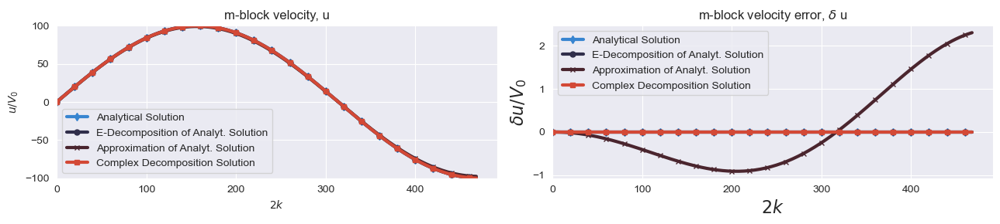

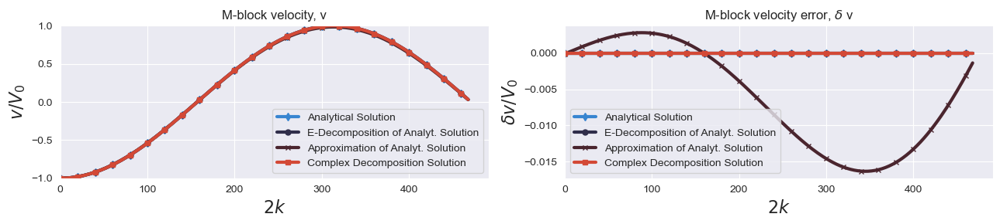

In [4]:
CP = collision(a=1e-2)
CP.Analityc()
CP.EingVal()
CP.Approx()
CP.CDecomp()
CP.plot_v(axis=0)
#plt.savefig('u.png',dpi=300)
CP.plot_v(axis=1)
#plt.savefig('v.png',dpi=300)

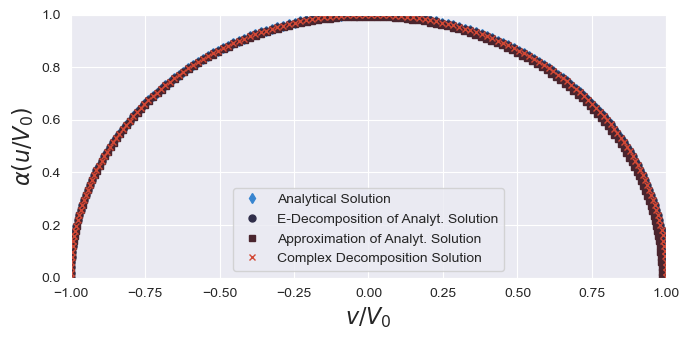

In [5]:
CP.plot_space()
plt.savefig('arco..png',dpi=300)

In [7]:
i  = np.arange(0.5,5.1,0.02)
a  = 10**(-i)
pi = count(a)

# Uma medida de Pi

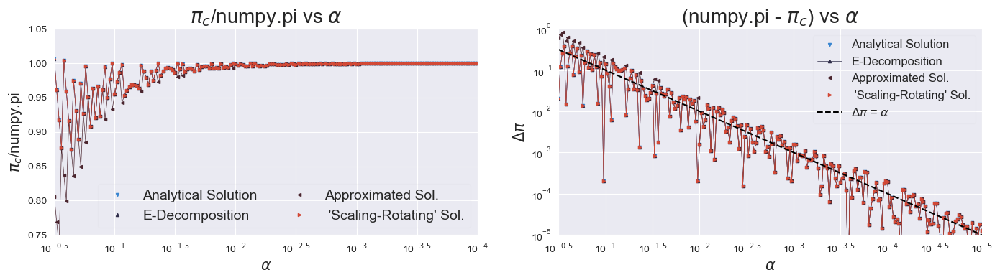

In [8]:
m = ["v","^","<",">"]
label = ['Analytical Solution','E-Decomposition','Approximated Sol.'," 'Scaling-Rotating' Sol."]

plt.figure(figsize=(14,4))
for j in np.arange(4):
    plt.subplot(1,2,1)
    plt.plot(i, pi[j,:]/np.pi,marker=m[j],ls='-',label=label[j],markersize=3,lw=0.5)

    plt.xticks(np.arange(0.5,4.1,0.5), ['10$^{-0.5}$','10$^{-1}$','10$^{-1.5}$','10$^{-2}$','10$^{-2.5}$','10$^{-3}$','10$^{-3.5}$','10$^{-4}$']   )
    plt.xlim(0.5,4)

    plt.yticks(np.arange(0.75,1.06,0.05))    
    plt.ylim(0.75,1.05)
    
    plt.xlabel(r'$\alpha$',fontsize=15)
    plt.ylabel(r'$\pi_c$/numpy.pi',fontsize=15)
    plt.title(r'$\pi_c$/numpy.pi vs $\alpha$',fontsize=20)
    plt.legend(ncol=2,fontsize=14,framealpha=0.1)


for j in np.arange(4):    
    plt.subplot(1,2,2)
    plt.semilogy(i, np.abs(np.pi - pi[j,:]),marker=m[j],ls='-',label=label[j],markersize=3,lw=0.5)

    plt.xticks(np.arange(0.5,5.1,0.5), ['10$^{-0.5}$','10$^{-1}$','10$^{-1.5}$','10$^{-2}$','10$^{-2.5}$','10$^{-3}$','10$^{-3.5}$','10$^{-4}$','10$^{-4.5}$','10$^{-5}$']   )
    plt.xlim(0.5,5)

    plt.ylim(1e-5,1e0)

    plt.xlabel(r'$\alpha$',fontsize=15)
    plt.ylabel(r'$\Delta \pi$',fontsize=15)
    plt.title(r'(numpy.pi - $\pi_c$) vs $\alpha$',fontsize=20)

plt.semilogy(i,a,'k--',label=r'$\Delta \pi$ = $\alpha$' )
plt.legend(ncol=1,fontsize=12,framealpha=0.1)

plt.tight_layout()

plt.savefig('pi_1.png',dpi=300)

# Corrigindo pi

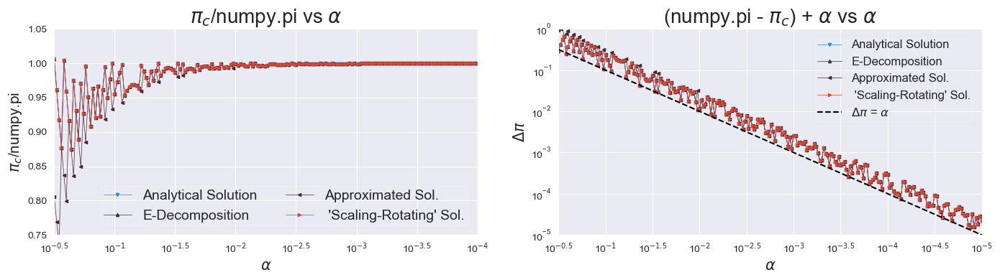

In [9]:
m = ["v","^","<",">"]
label = ['Analytical Solution','E-Decomposition','Approximated Sol.'," 'Scaling-Rotating' Sol."]

plt.figure(figsize=(14,4))
for j in np.arange(4):
    plt.subplot(1,2,1)
    plt.plot(i, pi[j,:]/np.pi,marker=m[j],ls='-',label=label[j],markersize=3,lw=0.5)

    plt.xticks(np.arange(0.5,4.1,0.5), ['10$^{-0.5}$','10$^{-1}$','10$^{-1.5}$','10$^{-2}$','10$^{-2.5}$','10$^{-3}$','10$^{-3.5}$','10$^{-4}$']   )
    plt.xlim(0.5,4)

    plt.yticks(np.arange(0.75,1.06,0.05))    
    plt.ylim(0.75,1.05)
    
    plt.xlabel(r'$\alpha$',fontsize=15)
    plt.ylabel(r'$\pi_c$/numpy.pi',fontsize=15)
    plt.title(r'$\pi_c$/numpy.pi vs $\alpha$',fontsize=20)
    plt.legend(ncol=2,fontsize=14,framealpha=0.1)


for j in np.arange(4):    
    plt.subplot(1,2,2)
    plt.semilogy(i,(np.pi - pi[j,:])+a,marker=m[j],ls='-',label=label[j],markersize=3,lw=0.5)

    plt.xticks(np.arange(0.5,5.1,0.5), ['10$^{-0.5}$','10$^{-1}$','10$^{-1.5}$','10$^{-2}$','10$^{-2.5}$','10$^{-3}$','10$^{-3.5}$','10$^{-4}$','10$^{-4.5}$','10$^{-5}$']   )
    plt.xlim(0.5,5)

    plt.ylim(1e-5,1e0)

    plt.xlabel(r'$\alpha$',fontsize=15)
    plt.ylabel(r'$\Delta \pi$',fontsize=15)
    plt.title(r'(numpy.pi - $\pi_c$) + $\alpha$ vs $\alpha$',fontsize=20)

plt.semilogy(i,a,'k--',label=r'$\Delta \pi$ = $\alpha$' )
plt.legend(ncol=1,fontsize=12,framealpha=0.1)

plt.tight_layout()

plt.savefig('pi_2.png',dpi=300)
